### Settings

In [0]:
%pip install folium
%pip install geopandas folium
%pip install azure-storage-blob
%pip install statsmodels
%pip install prophet

In [0]:
import pyspark
from pyspark.sql import SparkSession

from pyspark.sql.functions import col
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, FloatType, DateType, TimestampType

from pyspark.sql.functions import explode
from pyspark.sql.functions import posexplode

In [0]:
#-----------------------------------------------------------------------#
# Get Shape
#-----------------------------------------------------------------------#
def sparkShape(df):
    return (df.count(), len(df.columns))
pyspark.sql.dataframe.DataFrame.shape = sparkShape

#display(df_responses.shape())


### Importar archivos

In [0]:
# Initialize Spark session
#spark = SparkSession.builder.appName("LoadCSVFiles").getOrCreate()

storage_account_name = 'stgaclnrmlab'
storage_account_access_key = 'rf/4ogYc/eG+oqVD8K9xjsVamosf1qO1s0Kab+ujHsTt0GjaGY2XHfXFNVdti4iaUndCJjNSqizi+ASt8IWqHw=='

# Configurate access to Blob Storage
spark.conf.set(f"fs.azure.account.key.{storage_account_name}.blob.core.windows.net", storage_account_access_key)

# Blob Storage directory
blob_container = 'data'
directory_path_bel = f"wasbs://{blob_container}@{storage_account_name}.blob.core.windows.net/source/Bel"
directory_path_and = f"wasbs://{blob_container}@{storage_account_name}.blob.core.windows.net/source/And"
directory_path_bxl = f"wasbs://{blob_container}@{storage_account_name}.blob.core.windows.net/source/Bxl"


In [0]:
# Listar archivos en el directorio
file_list = dbutils.fs.ls(directory_path_bel)
file_list

In [0]:
# Define schema
schema = StructType([
    StructField("datetime", TimestampType(), True),
    StructField("street_id", StringType(), True),
    StructField("count", IntegerType(), True),
    StructField("speed", FloatType(), True)
])

# Inicializar el DataFrame
df_bel_stream_05m = None
df_bel_stream_15m = None
df_bel_stream_30m = None
df_bel_stream_60m = None

# Recorrer la lista de archivos
for file_info in file_list:
    file_name = file_info.name
    if file_name.startswith("Bel_05min") and file_name.endswith(".csv"):
        file_path = file_info.path
        # Cargar el archivo CSV en un DataFrame temporal
        temp_df = spark.read.format("csv").option("header", "false").schema(schema).load(file_path)
        # Hacer append al DataFrame principal
        if df_bel_stream_05m is None:
            df_bel_stream_05m = temp_df
        else:
            df_bel_stream_05m = df_bel_stream_05m.union(temp_df)
    if file_name.startswith("Bel_15min") and file_name.endswith(".csv"):
        file_path = file_info.path
        # Cargar el archivo CSV en un DataFrame temporal
        temp_df = spark.read.format("csv").option("header", "false").schema(schema).load(file_path)
        # Hacer append al DataFrame principal
        if df_bel_stream_15m is None:
            df_bel_stream_15m = temp_df
        else:
            df_bel_stream_15m = df_bel_stream_15m.union(temp_df)
    if file_name.startswith("Bel_30min") and file_name.endswith(".csv"):
        file_path = file_info.path
        # Cargar el archivo CSV en un DataFrame temporal
        temp_df = spark.read.format("csv").option("header", "false").schema(schema).load(file_path)
        # Hacer append al DataFrame principal
        if df_bel_stream_30m is None:
            df_bel_stream_30m = temp_df
        else:
            df_bel_stream_30m = df_bel_stream_30m.union(temp_df)

In [0]:
print("df shape: ", df_bel_stream_15m.shape())

max_datetime = df_bel_stream_15m.select(max('datetime')).collect()[0][0]
min_datetime = df_bel_stream_15m.select(min('datetime')).collect()[0][0]

print("Min datetime in df:", min_datetime)
print("Max datetime in df:", max_datetime)

In [0]:
from pyspark.sql.functions import to_timestamp, date_format, col, min, max

# Set data types
df_bel_stream_15m = df_bel_stream_15m.withColumn("datetime", to_timestamp(col("datetime"), "yyyy-MM-dd'T'HH:mm:ss.SSSXXX"))\
.withColumn("street_id", col("street_id").cast("integer"))\
.withColumn("street_id", col("street_id").cast("string"))\
.withColumn("count", col("count").cast("integer"))\
.withColumn("speed", col("speed").cast("float"))

#.withColumn("date", (date_format(col("datetime"), "yyyy-MM-dd")).cast("date"))\
#.withColumn("time", (date_format(col("datetime"), "HH:mm:ss")).cast("string"))\

# Order df
df_bel_stream_15m = df_bel_stream_15m.orderBy('street_id','datetime')

# Filter only 2019n data
df_bel_stream_15m = df_bel_stream_15m.filter((df_bel_stream_15m['datetime'] <= '2019-12-01 00:00:00.000+00:00') & (df_bel_stream_15m['datetime'] >= '2019-01-07 00:00:00.000+00:00'))

In [0]:
print("df shape: ", df_bel_stream_15m.shape())

max_datetime = df_bel_stream_15m.select(max('datetime')).collect()[0][0]
min_datetime = df_bel_stream_15m.select(min('datetime')).collect()[0][0]

print("Min datetime in df:", min_datetime)
print("Max datetime in df:", max_datetime)

### Crear dataset completo

In [0]:
from pyspark.sql.functions import col, sum, count, lit,  sequence, explode, date_format, dayofmonth, dayofweek, hour, minute, to_timestamp, when, weekofyear, month
from pyspark.sql.types import TimestampType

# Define min and max dates
start_date = min_datetime #"2019-01-07T00:00:00.000+00:00"
end_date = max_datetime #"2019-02-28T23:45:00.000+00:00"

# Generate full range of timestamps between start and end date, every 15 minutes
timestamps = spark.sql(f"SELECT explode(sequence(to_timestamp('{start_date}'), to_timestamp('{end_date}'), interval 15 minutes)) as datetime_full")

timestamps = timestamps.withColumn("date", (date_format(col("datetime_full"), "yyyy-MM-dd")).cast("date"))\
       .withColumn("month", month(col("datetime_full"))) \
       .withColumn("week_of_year", weekofyear(col("datetime_full"))) \
       .withColumn("day_of_month", dayofmonth(col("datetime_full"))) \
       .withColumn("day_of_week", dayofweek(col("datetime_full"))) \
       .withColumn("weekend", when((dayofweek(col("datetime_full")).isin([1, 7])), 1).otherwise(0)) \
       .withColumn("time", (date_format(col("datetime_full"), "HH:mm:ss")).cast("string"))\
       .withColumn("hour", hour(col("datetime_full"))) \
       .withColumn("minutes", minute(col("datetime_full"))) \
       .withColumn("time_period", 
                   when((hour(col("datetime_full")) >= 6) & (hour(col("datetime_full")) < 12), "morning")
                   .when((hour(col("datetime_full")) >= 12) & (hour(col("datetime_full")) < 18), "afternoon")
                   .when((hour(col("datetime_full")) >= 18) & (hour(col("datetime_full")) < 24), "evening")
                   .otherwise("night"))

# Generate streets
streets = df_bel_stream_15m.select(col("street_id").alias("street")).distinct()
streets = streets.withColumn("dummy", lit(1))

# Create df 
df_time = streets.crossJoin(timestamps).drop("dummy")

In [0]:
# Join data df to df_time
df_bel_stream_15m_complete = df_time.join(df_bel_stream_15m, on=[(df_time.datetime_full == df_bel_stream_15m.datetime) & (df_time.street == df_bel_stream_15m.street_id)], how="left")

df_bel_stream_15m_complete = df_bel_stream_15m_complete.drop("street_id", "datetime")

df_bel_stream_15m_complete = df_bel_stream_15m_complete.fillna({'count': 0})
df_bel_stream_15m_complete = df_bel_stream_15m_complete.fillna({'speed': 0})

In [0]:
df_bel_stream_15m_complete.write \
    .format("delta") \
    .mode("overwrite") \
    .saveAsTable("default.df_bel_stream_15m_complete")

In [0]:
display(df_bel_stream_15m_complete)

In [0]:
print("df shape: ", df_bel_stream_15m_complete.shape())

max_datetime_complete = df_bel_stream_15m_complete.select(max('datetime_full')).collect()[0][0]
min_datetime_complete = df_bel_stream_15m_complete.select(min('datetime_full')).collect()[0][0]

print("Min datetime in df:", min_datetime_complete)
print("Max datetime in df:", max_datetime_complete)

### Histogramas

In [0]:
df_bel_stream_15m_complete = spark.table("default.df_bel_stream_15m_complete")

In [0]:
display(df_bel_stream_15m_complete)

street,datetime_full,date,month,week_of_year,day_of_month,day_of_week,weekend,time,hour,minutes,time_period,count,speed
2557,2019-01-18T05:15:00Z,2019-01-18,1,3,18,6,0,05:15:00,5,15,night,26,77.13461
3224,2019-01-21T22:30:00Z,2019-01-21,1,4,21,2,0,22:30:00,22,30,evening,3,84.666664
263,2019-02-01T10:00:00Z,2019-02-01,2,5,1,6,0,10:00:00,10,0,morning,8,74.75
4916,2019-02-01T20:00:00Z,2019-02-01,2,5,1,6,0,20:00:00,20,0,evening,1,80.0
4735,2019-02-02T03:15:00Z,2019-02-02,2,5,2,7,1,03:15:00,3,15,night,2,73.0
3062,2019-02-11T13:45:00Z,2019-02-11,2,7,11,2,0,13:45:00,13,45,afternoon,1,58.0
2697,2019-02-15T07:15:00Z,2019-02-15,2,7,15,6,0,07:15:00,7,15,morning,23,56.15942
3602,2019-02-18T14:00:00Z,2019-02-18,2,8,18,2,0,14:00:00,14,0,afternoon,6,58.5
5023,2019-01-07T06:15:00Z,2019-01-07,1,2,7,2,0,06:15:00,6,15,morning,46,56.880436
419,2019-01-11T07:00:00Z,2019-01-11,1,2,11,6,0,07:00:00,7,0,morning,5,63.9


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks data profile. Run in Databricks to view.

In [0]:
df_bel_stream_15m_complete.createOrReplaceTempView('df_bel_stream_15m_complete_vw')

In [0]:
result_topstreets = spark.sql("""
SELECT
    street,
    count(*) as reg,
    sum(count) as countn
FROM df_bel_stream_15m_complete_vw
GROUP BY street
ORDER BY countn DESC
LIMIT 1000
""")

# Convertir la columna 'street' en una lista
Top_street_list = [row['street'] for row in result_topstreets.collect()]

In [0]:
display(df_bel_stream_15m_complete.filter(df_bel_stream_15m_complete['street'].isin(Top_street_list)))

street,datetime_full,date,month,week_of_year,day_of_month,day_of_week,weekend,time,hour,minutes,time_period,count,speed
5076,2019-01-10T08:30:00Z,2019-01-10,1,2,10,5,0,08:30:00,8,30,morning,62,84.08871
994,2019-01-30T17:30:00Z,2019-01-30,1,5,30,4,0,17:30:00,17,30,afternoon,39,83.82051
3410,2019-02-04T15:00:00Z,2019-02-04,2,6,4,2,0,15:00:00,15,0,afternoon,45,82.37778
5020,2019-02-06T22:45:00Z,2019-02-06,2,6,6,4,0,22:45:00,22,45,evening,8,74.3125
3928,2019-02-07T03:45:00Z,2019-02-07,2,6,7,5,0,03:45:00,3,45,night,40,86.30625
1752,2019-02-14T15:00:00Z,2019-02-14,2,7,14,5,0,15:00:00,15,0,afternoon,110,83.05909
2939,2019-02-16T03:30:00Z,2019-02-16,2,7,16,7,1,03:30:00,3,30,night,13,85.84615
960,2019-02-16T13:30:00Z,2019-02-16,2,7,16,7,1,13:30:00,13,30,afternoon,1,91.5
3267,2019-02-16T18:00:00Z,2019-02-16,2,7,16,7,1,18:00:00,18,0,evening,12,85.23572
4725,2019-02-16T23:45:00Z,2019-02-16,2,7,16,7,1,23:45:00,23,45,evening,4,86.875


Databricks data profile. Run in Databricks to view.

In [0]:
percentiles = [0.25, 0.5, 0.75]

# Calcular los percentiles usando approxQuantile
result_percentiles = df_bel_stream_15m_complete.filter(df_bel_stream_15m_complete['street'].isin(Top_street_list)).approxQuantile("count", percentiles, 0.01)

# Mostrar los resultados
percentiles_with_values = list(zip(percentiles, result_percentiles))
for percentile, value in percentiles_with_values:
    print(f"Percentile {percentile * 100}%: {value}")

Percentile 25.0%: 5.0
Percentile 50.0%: 17.0
Percentile 75.0%: 39.0


In [0]:
percentiles = [0.25, 0.5, 0.75]

# Calcular los percentiles usando approxQuantile
result_percentiles = df_bel_stream_15m_complete.filter(df_bel_stream_15m_complete['street'].isin(Top_street_list)).approxQuantile("speed", percentiles, 0.01)

# Mostrar los resultados
percentiles_with_values = list(zip(percentiles, result_percentiles))
for percentile, value in percentiles_with_values:
    print(f"Percentile {percentile * 100}%: {value}")

Percentile 25.0%: 75.5
Percentile 50.0%: 84.14286041259766
Percentile 75.0%: 86.28571319580078


In [0]:
#pdf_complete = df_bel_stream_15m_complete.toPandas()

pdf_complete = df_bel_stream_15m_complete.filter(df_bel_stream_15m_complete['street'].isin(Top_street_list)).toPandas()

#pdf_complete = df_bel_stream_15m_complete.filter((df_bel_stream_15m_complete['street']== '1593') | (df_bel_stream_15m_complete['street']== '2613') | (df_bel_stream_15m_complete['street']== '1845')).toPandas()




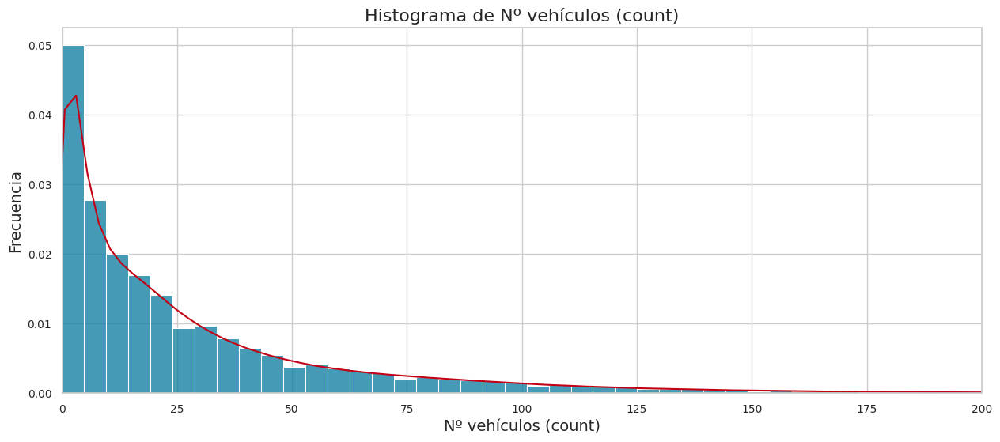

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(pdf_complete['count'], bins=100, color='#077A9D', kde=False, stat='density')
sns.kdeplot(pdf_complete['count'], color='#C20114')

# Limitar los rangos de X
plt.xlim(0, 200)

# Agregar títulos y etiquetas
plt.title('Histograma de Nº vehículos (count)', fontsize=16)
plt.xlabel('Nº vehículos (count)', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()


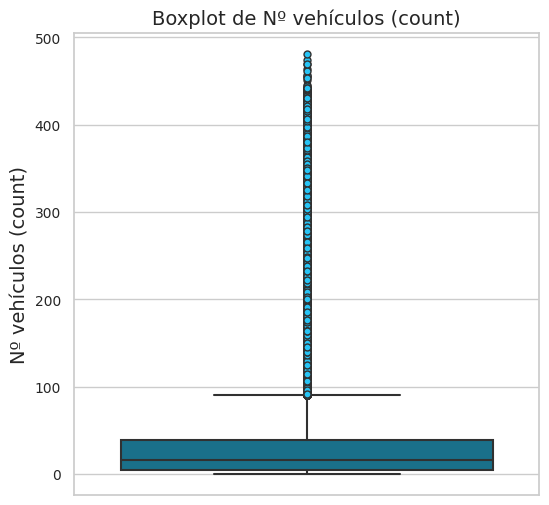

In [0]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the boxplot
plt.figure(figsize=(6, 6))
sns.boxplot(y=pdf_complete['count'], color="#077A9D", flierprops=dict(markerfacecolor='#27C4F5', marker='o'))
plt.title('Boxplot de Nº vehículos (count)', fontsize=14)
plt.ylabel('Nº vehículos (count)', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()


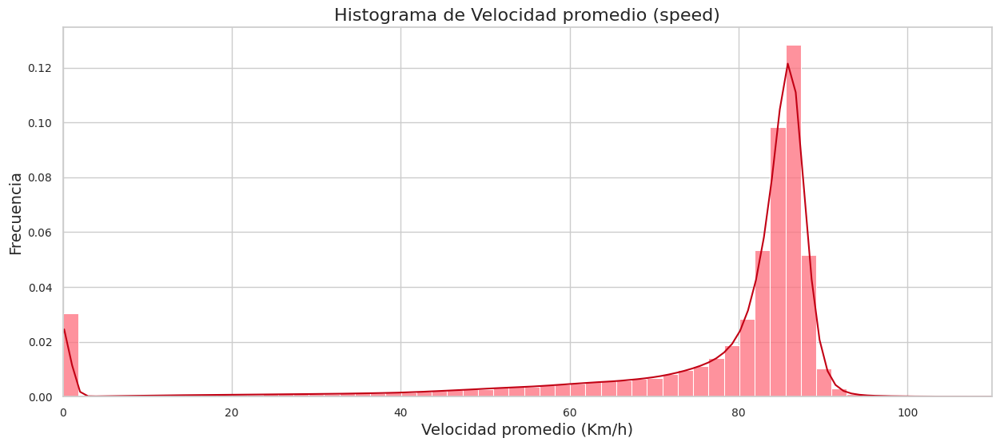

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(pdf_complete['speed'], bins=100, color='#FE6E7C', kde=False, stat='density')
sns.kdeplot(pdf_complete['speed'], color='#C20114')

# Limitar los rangos de X
plt.xlim(0, 110)

# Agregar títulos y etiquetas
plt.title('Histograma de Velocidad promedio (speed)', fontsize=16)
plt.xlabel('Velocidad promedio (Km/h)', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

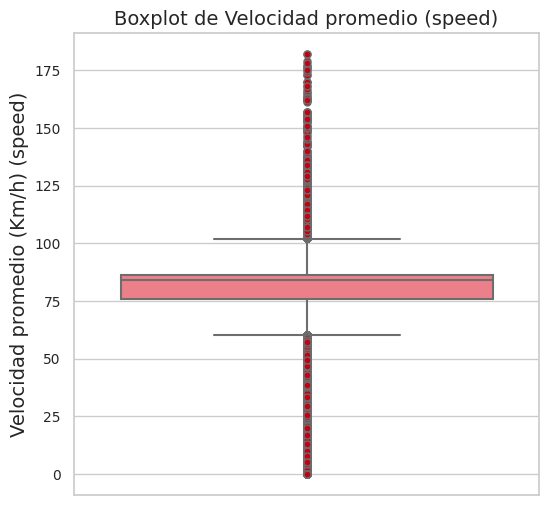

In [0]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the boxplot
plt.figure(figsize=(6, 6))
sns.boxplot(y=pdf_complete['speed'], color="#FE6E7C", flierprops=dict(markerfacecolor='#C20114', marker='o'))
plt.title('Boxplot de Velocidad promedio (speed)', fontsize=14)
plt.ylabel('Velocidad promedio (Km/h) (speed)', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

Obtener muestra de streets

In [0]:
df_bel_stream_15m_complete.createOrReplaceTempView('df_bel_stream_15m_complete_vw')

In [0]:
%sql
SELECT

street,
count(*) as reg,
sum(count) as countn
FROM df_bel_stream_15m_complete_vw
GROUP BY street
order by countn desc
LIMIT 100


street,reg,countn
1593,5088,794668
2613,5088,778590
1845,5088,634673
482,5088,596828
1583,5088,595254
1365,5088,586603
4659,5088,586075
2537,5088,577875
1336,5088,565967
395,5088,551154


### Analisis de Top 3 streets street_id

In [0]:
df_bel_stream_15m_complete = spark.table("default.df_bel_stream_15m_complete")

In [0]:
df_bel_stream_15m_sub = df_bel_stream_15m_complete.filter((df_bel_stream_15m_complete['street']== '1593') | (df_bel_stream_15m_complete['street']== '2613') | (df_bel_stream_15m_complete['street']== '1845'))

In [0]:
print("df shape: ", df_bel_stream_15m_sub.shape())

max_datetime_sub = df_bel_stream_15m_sub.select(max('datetime_full')).collect()[0][0]
min_datetime_sub = df_bel_stream_15m_sub.select(min('datetime_full')).collect()[0][0]

print("Min datetime in df:", min_datetime_sub)
print("Max datetime in df:", max_datetime_sub)

In [0]:
display(df_bel_stream_15m_sub)

In [0]:

#from pyspark.sql import SparkSession
#from pyspark.sql.functions import sum, count
#import matplotlib.pyplot as plt
#
## Agrupar 
##df_bel_stream_15m_sub_grp = df_bel_stream_15m_sub_full.filter((df_bel_stream_15m_sub_full['datetime_full'] <= '2019-01-07 00:00:00.000+00:00')).groupBy('datetime_full').agg(sum#('count').alias('count'))
##df_bel_stream_15m_sub_grp = df_bel_stream_15m_sub_full.groupBy('datetime_full').agg(sum('count').alias('count'))
#
#df_bel_stream_15m_sub_grp = df_bel_stream_15m_sub.filter((df_bel_stream_15m_sub['datetime_full'] <= '2019-01-07 00:00:00.000+00:00')).groupBy('datetime_full').agg(sum('count').#alias('count'))
##df_bel_stream_15m_sub_grp = df_bel_stream_15m_sub.groupBy('datetime_full').agg(sum('count').alias('count'))
#
## Recopilar
#data = df_bel_stream_15m_sub_grp.toPandas()
#
## Graficar 
#plt.figure(figsize=(20,5))
#plt.plot(data['datetime_full'], data['count'], color='blue')
#plt.xticks(rotation=45)
#plt.title('Belgica - OBU 15min - Conteo total de camiones')
#plt.show()
#


In [0]:
#from pyspark.sql import SparkSession
#from pyspark.sql.functions import sum as sum
#import matplotlib.pyplot as plt
#
## Agrupar 
#df_bel_stream_15m_sub_grp = df_bel_stream_15m_sub.filter((df_bel_stream_15m_sub['datetime'] <= '2019-01-02 00:00:00.000+00:00')).groupBy('datetime').agg(sum('count').alias#('count'))
#
##df_bel_stream_15m_sub_grp = df_bel_stream_15m_sub_grp.groupBy('datetime').agg(sum('count').alias('count'))
#
## Recopilar
#data = df_bel_stream_15m_sub_grp.toPandas()
#
## Graficar 
#plt.figure(figsize=(20,5))
#plt.plot(data['datetime'], data['speed'], color='red')
#plt.xticks(rotation=45)
#plt.title('Belgica - OBU 15min - Velocidad de camiones')
#plt.show()

### Analizar ciclos

In [0]:
pdf_3s = df_bel_stream_15m_sub.toPandas()

In [0]:
import matplotlib.pyplot as plt

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(20, 5))

# Crear el diagrama de caja usando matplotlib y patch_artist=True para colorear
boxplot = pdf_3s.boxplot(column='count', by='day_of_week', patch_artist=True, grid=False, ax=ax)

# Colorear los boxes
for box in boxplot.artists:
    box.set_facecolor('#077A9D')
    box.set_linewidth(2)

# Colorear los median
for median in boxplot.lines[4::6]:
    median.set_color('#D62728')  # Puedes cambiar el color de la mediana si lo deseas
    median.set_linewidth(2)

# Colorear los fliers (outliers)
for flier in boxplot.lines[5::6]:
    flier.set_markerfacecolor('#077A9D')
    flier.set_alpha(0.5)

# Personalizar el gráfico
plt.title('Boxplot de Cantidad de vehiculos (count) por Día de la semana', fontsize=15)
plt.suptitle('')
plt.xlabel('Día de la semana', fontsize=12)
plt.ylabel('Cantidad de vehiculos (count)', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar el gráfico
plt.show()


In [0]:
# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(20, 5))

# Crear el diagrama de caja usando matplotlib y patch_artist=True para colorear
boxplot = pdf_3s.boxplot(column='count', by='day_of_month', patch_artist=True, grid=False, ax=ax)

# Colorear los boxes
for box in boxplot.artists:
    box.set_facecolor('#077A9D')
    box.set_linewidth(2)

# Colorear los median
for median in boxplot.lines[4::6]:
    median.set_color('#D62728')  # Puedes cambiar el color de la mediana si lo deseas
    median.set_linewidth(2)

# Colorear los fliers (outliers)
for flier in boxplot.lines[5::6]:
    flier.set_markerfacecolor('#077A9D')
    flier.set_alpha(0.5)

# Personalizar el gráfico
plt.title('Boxplot de Cantidad de vehiculos (count) por Día del Mes', fontsize=15)
plt.suptitle('')
plt.xlabel('Día del Mes', fontsize=12)
plt.ylabel('Cantidad de vehiculos (count)', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar el gráfico
plt.show()

In [0]:
import matplotlib.pyplot as plt

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(20, 5))

# Crear el diagrama de caja usando matplotlib y patch_artist=True para colorear
boxplot = pdf_3s.boxplot(column='count', by='hour', patch_artist=True, grid=False, ax=ax)

# Colorear los boxes
for box in boxplot.artists:
    box.set_facecolor('#077A9D')
    box.set_linewidth(2)

# Colorear los median
for median in boxplot.lines[4::6]:
    median.set_color('#D62728')  # Puedes cambiar el color de la mediana si lo deseas
    median.set_linewidth(2)

# Colorear los fliers (outliers)
for flier in boxplot.lines[5::6]:
    flier.set_markerfacecolor('#077A9D')
    flier.set_alpha(0.5)

# Personalizar el gráfico
plt.title('Boxplot de Cantidad de vehiculos (count) por Hora', fontsize=15)
plt.suptitle('')
plt.xlabel('Hora', fontsize=12)
plt.ylabel('Cantidad de vehiculos (count)', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar el gráfico
plt.show()

In [0]:
# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(20, 5))

# Crear el diagrama de caja usando matplotlib y patch_artist=True para colorear
boxplot = pdf_3s.boxplot(column='count', by='time_period', patch_artist=True, grid=False, ax=ax)

# Colorear los boxes
for box in boxplot.artists:
    box.set_facecolor('#077A9D')
    box.set_linewidth(2)

# Colorear los median
for median in boxplot.lines[4::6]:
    median.set_color('#D62728')  # Puedes cambiar el color de la mediana si lo deseas
    median.set_linewidth(2)

# Colorear los fliers (outliers)
for flier in boxplot.lines[5::6]:
    flier.set_markerfacecolor('#077A9D')
    flier.set_alpha(0.5)

# Personalizar el gráfico
plt.title('Boxplot de Cantidad de vehiculos (count) por Tramo horario', fontsize=15)
plt.suptitle('')
plt.xlabel('Tramo horario', fontsize=12)
plt.ylabel('Cantidad de vehiculos (count)', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar el gráfico
plt.show()

In [0]:
import matplotlib.pyplot as plt

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(20, 5))

# Crear el diagrama de caja usando matplotlib y patch_artist=True para colorear
boxplot = pdf_3s.boxplot(column='count', by='minutes', patch_artist=True, grid=False, ax=ax)

# Colorear los boxes
for box in boxplot.artists:
    box.set_facecolor('#077A9D')
    box.set_linewidth(2)

# Colorear los median
for median in boxplot.lines[4::6]:
    median.set_color('#D62728')  # Puedes cambiar el color de la mediana si lo deseas
    median.set_linewidth(2)

# Colorear los fliers (outliers)
for flier in boxplot.lines[5::6]:
    flier.set_markerfacecolor('#077A9D')
    flier.set_alpha(0.5)

# Personalizar el gráfico
plt.title('Boxplot de Cantidad de vehiculos (count) por Rango de minutos', fontsize=15)
plt.suptitle('')
plt.xlabel('Rango de minutos', fontsize=12)
plt.ylabel('Cantidad de vehiculos (count)', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar el gráfico
plt.show()

### Descomposisicón de serie de tiempo 1593

In [0]:
# Convertir a pandas solo una street
pdf = df_bel_stream_15m_complete.filter((df_bel_stream_15m_complete['street']== '1593')).toPandas()
#pdf = df_bel_stream_15m_complete.toPandas()

In [0]:
from statsmodels.tsa.seasonal import seasonal_decompose


# Convertir la columna 'date' a índice
pdf.set_index('datetime_full', inplace=True)

# Realizar la descomposición
result = seasonal_decompose(pdf['count'], model='additive', period= 576) #period = 672 (ciclo de 7 días), #period = 576 (ciclo de 6 días) , extrapolate_trend=385 (4 días)

# model='additive' --> serie se descompone en serie = trend + seasonal +resid
# period: None --> se intenta inferir el período de la serie de tiempo a partir de la frecuencia de los datos
# two_sided: True --> indica si se debe usar una media centrada para calcular la tendencia (si es True) o una media simple (si es False).
# extrapolate_trend: 0 --> controla la cantidad de extrapolación de la tendencia. Por defecto, no se extrapola la tendencia (se usa 0). Se puede configurar para extrapolar la tendencia para manejar bordes de datos.

# Acceder a los componentes
trend = result.trend
seasonal = result.seasonal
resid = result.resid

trend_df = spark.createDataFrame(trend.reset_index())
seasonal_df = spark.createDataFrame(seasonal.reset_index())
resid_df = spark.createDataFrame(resid.reset_index())


In [0]:
display(df_bel_stream_15m_sub.filter((df_bel_stream_15m_complete['street']== '1593')))

Esta descomposici´on se basa en:
**Serie observada = Tendencia + Efecto estacional + Residuos**

- La tendencia se calcula con la media m´ovil. En R se utiliza una ventana de 15 elementos. (AQUI de cuanto???)
- El efecto estacional se calcula promediando los valores decada unidad de tiempo para todos los per´ıodos (por ejemplo, todos los meses de enero si la serie es mensual).
- Los residuos se obtienen restando a la serie observada las dos componentes anteriores.

In [0]:
display(trend_df)

datetime_full,trend
2019-01-20T09:15:00Z,null
2019-01-21T19:15:00Z,null
2019-01-23T23:00:00Z,null
2019-01-27T12:45:00Z,null
2019-02-02T03:45:00Z,null
2019-02-03T03:00:00Z,null
2019-02-05T14:15:00Z,null
2019-02-07T22:00:00Z,null
2019-02-08T13:15:00Z,null
2019-02-10T13:30:00Z,null


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

In [0]:
display(seasonal_df)

datetime_full,seasonal
2019-01-20T09:15:00Z,15.629437966321515
2019-01-21T19:15:00Z,-81.62891706840072
2019-01-23T23:00:00Z,1.4896810218770644
2019-01-27T12:45:00Z,56.60654300104373
2019-02-02T03:45:00Z,37.743153244099275
2019-02-03T03:00:00Z,-21.884559429511828
2019-02-05T14:15:00Z,45.47698570937707
2019-02-07T22:00:00Z,-22.619476964234053
2019-02-08T13:15:00Z,-42.08996307534516
2019-02-10T13:30:00Z,-70.95682505451184


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

In [0]:
display(resid_df)

datetime_full,resid
2019-01-20T09:15:00Z,null
2019-01-21T19:15:00Z,null
2019-01-23T23:00:00Z,null
2019-01-27T12:45:00Z,null
2019-02-02T03:45:00Z,null
2019-02-03T03:00:00Z,null
2019-02-05T14:15:00Z,null
2019-02-07T22:00:00Z,null
2019-02-08T13:15:00Z,null
2019-02-10T13:30:00Z,null


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

In [0]:
trend_pdf = trend_df.toPandas()

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(trend_pdf['trend'], bins=50, color='#27C4F5', kde=False, stat='density')
sns.kdeplot(trend_pdf['trend'], color='#C20114')

# Limitar los rangos de X
#plt.xlim(-200, 200)

# Agregar títulos y etiquetas
plt.title('Histograma de Tendencia', fontsize=16)
plt.xlabel('Tendencia', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
seasonal_pdf = seasonal_df.toPandas()

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(seasonal_pdf['seasonal'], bins=50, color='#27C4F5', kde=False, stat='density')
sns.kdeplot(seasonal_pdf['seasonal'], color='#C20114')

# Limitar los rangos de X
plt.xlim(-200, 200)

# Agregar títulos y etiquetas
plt.title('Histograma de Componente Estacional', fontsize=16)
plt.xlabel('Componente Estacional', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
resid_pdf = resid_df.toPandas()

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(resid_pdf['resid'], bins=50, color='#27C4F5', kde=False, stat='density')
sns.kdeplot(resid_pdf['resid'], color='#C20114')

# Limitar los rangos de X
plt.xlim(-300, 350)

# Agregar títulos y etiquetas
plt.title('Histograma de Residuos', fontsize=16)
plt.xlabel('Residuos', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

### Descomposición con múltiples estacionalidades simultáneas

In [0]:
df = df_bel_stream_15m_complete.filter((df_bel_stream_15m_complete['street']== '1593'))

In [0]:
#pdf = df.toPandas()
pdf = df_bel_stream_15m_complete.filter((df_bel_stream_15m_complete['street']== '1593')).toPandas()

In [0]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Convertir la columna 'date' a índice
pdf.set_index('datetime_full', inplace=True)

# Descomposición del ciclo semanal
result_weekly = seasonal_decompose(pdf['count'], model='additive', period=672)

# Acceder a los componentes
trend_weekly = result_weekly.trend
seasonal_weekly = result_weekly.seasonal
resid_weekly = result_weekly.resid

df_trend_weekly = spark.createDataFrame(trend_weekly.reset_index())
df_seasonal_weekly = spark.createDataFrame(seasonal_weekly.reset_index())
df_resid_weekly = spark.createDataFrame(resid_weekly.reset_index())

# Graficar la descomposición semanal
#result_weekly.plot()
#plt.show()

# Remover la estacionalidad semanal
pdf_deseasonalized_weekly = pdf['count'] - result_weekly.seasonal
df_deseasonalized_weekly = spark.createDataFrame(pdf_deseasonalized_weekly.reset_index())

# Descomposición del ciclo intra-diario
result_daily = seasonal_decompose(pdf_deseasonalized_weekly, model='additive', period=96)

# Acceder a los componentes
trend_daily = result_daily.trend
seasonal_daily = result_daily.seasonal
resid_daily = result_daily.resid

df_trend_daily = spark.createDataFrame(trend_daily.reset_index())
df_seasonal_daily = spark.createDataFrame(seasonal_daily.reset_index())
df_resid_daily = spark.createDataFrame(resid_daily.reset_index())

# Graficar la descomposición intra-diaria
#result_daily.plot()
#plt.show()

In [0]:
from pyspark.sql.functions import col, lit

df_trend_weekly = df_trend_weekly.withColumnRenamed("trend", "trend_weekly")
df_seasonal_weekly = df_seasonal_weekly.withColumnRenamed("seasonal", "seasonal_weekly")
df_resid_weekly = df_resid_weekly.withColumnRenamed("resid", "resid_weekly")
df_trend_daily = df_trend_daily.withColumnRenamed("trend", "trend_daily")
df_seasonal_daily = df_seasonal_daily.withColumnRenamed("seasonal", "seasonal_daily")
df_resid_daily = df_resid_daily.withColumnRenamed("resid", "resid_daily")
df_deseasonalized_weekly = df_deseasonalized_weekly.withColumnRenamed("0", "count_deseasonalized")

# Realizar los joins
df_decomposed = df.select("datetime_full", "count").join(df_deseasonalized_weekly, "datetime_full", "outer") \
    .join(df_trend_weekly, "datetime_full", "outer") \
    .join(df_seasonal_weekly, "datetime_full", "outer") \
    .join(df_resid_weekly, "datetime_full", "outer") \
    .join(df_trend_daily, "datetime_full", "outer") \
    .join(df_seasonal_daily, "datetime_full", "outer") \
    .join(df_resid_daily, "datetime_full", "outer")

df_decomposed = df_decomposed.withColumn("count_diff", col("count") - col("count_deseasonalized")) \
    .withColumn("trend_diff", col("trend_weekly") - col("trend_daily")) \
    .withColumn("seasonal_diff", col("seasonal_weekly") - col("seasonal_daily")) \
    .withColumn("resid_diff", col("resid_weekly") - col("resid_daily"))

# save
#df_decomposed.write \
#    .format("delta") \
#    .mode("overwrite") \
#    .saveAsTable("default.df_bel_15m_serie1593_decomposed")

In [0]:
display(df_decomposed)

datetime_full,count,count_deseasonalized,trend_weekly,seasonal_weekly,resid_weekly,trend_daily,seasonal_daily,resid_daily,count_diff,trend_diff,seasonal_diff,resid_diff
2019-01-07T00:00:00Z,21,-24.600083288833886,null,45.600083288833886,null,144.04023427482352,-9.049659331080486,-159.5906582325769,45.600083288833886,null,54.64974261991437,null
2019-01-07T00:15:00Z,24,55.38531920549718,157.25446428571425,-31.38531920549718,-101.86914508021707,146.16932672126387,5.417716229879402,-96.20172374564609,-31.385319205497183,11.085137564450378,-36.80303543537658,-5.6674213345709745
2019-01-07T00:30:00Z,21,-2.4643831754552004,156.61979166666666,23.4643831754552,-159.08417484212185,191.0551807373495,9.487721426615382,-203.0072853394201,23.4643831754552,-34.435389070682845,13.976661748839819,43.92311049729824
2019-01-07T00:45:00Z,19,91.93997127465818,157.85863095238096,-72.93997127465818,-65.91865967772279,167.88938959993098,3.527441018921122,-79.47685934419393,-72.93997127465818,-10.030758647550016,-76.4674122935793,13.55819966647114
2019-01-07T01:00:00Z,21,-20.446809479310076,155.30580357142858,41.446809479310076,-175.75261305073866,165.9134578426795,-1.3190085473378477,-185.0412587746517,41.446809479310076,-10.607654271250908,42.76581802664792,9.28864572391305
2019-01-07T01:15:00Z,30,98.28508536195976,155.43749999999997,-68.28508536195976,-57.15241463804021,156.93152092728832,6.784290264278316,-65.43072582960687,-68.28508536195976,-1.4940209272883465,-75.06937562623807,8.278311191566658
2019-01-07T01:30:00Z,24,42.71043258418199,null,-18.71043258418199,null,139.38197477419166,4.372341733363543,-101.04388392337322,-18.710432584181987,null,-23.082774317545535,null
2019-01-07T01:45:00Z,32,88.98332090617745,null,-56.983320906177454,null,null,8.928891655557655,null,-56.983320906177454,null,-65.9122125617351,null
2019-01-07T02:00:00Z,33,53.713550498014186,154.80208333333334,-20.71355049801419,-101.08853283531916,150.02428006327779,-9.098289365964543,-87.21244019929905,-20.713550498014186,4.777803270055557,-11.615261132049646,-13.876092636020104
2019-01-07T02:15:00Z,46,97.99660747080331,160.1584821428571,-51.99660747080331,-62.1618746720538,157.82971327171742,-1.3962219626685943,-58.43688383824552,-51.99660747080331,2.328768871139687,-50.60038550813472,-3.7249908338082776


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

In [0]:
decomposed_pdf = df_decomposed.toPandas()

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(decomposed_pdf['trend_weekly'], bins=50, color='#01394A', kde=False, stat='density')
sns.kdeplot(decomposed_pdf['trend_weekly'], color='#C20114')

# Limitar los rangos de X
#plt.xlim(-200, 200)

# Agregar títulos y etiquetas
plt.title('Histograma de Tendencia - Periodo semanal', fontsize=16)
plt.xlabel('Tendencia', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(decomposed_pdf['trend_daily'], bins=50, color='#27C4F5', kde=False, stat='density')
sns.kdeplot(decomposed_pdf['trend_daily'], color='#C20114')

# Limitar los rangos de X
#plt.xlim(-200, 200)

# Agregar títulos y etiquetas
plt.title('Histograma de Tendencia - Periodo diario', fontsize=16)
plt.xlabel('Tendencia', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
#sns.histplot(decomposed_pdf['trend_daily'], bins=50, color='#27C4F5', kde=False, stat='density')
sns.kdeplot(decomposed_pdf['trend_weekly'], color='#01394A')
sns.kdeplot(decomposed_pdf['trend_daily'], color='#27C4F5')

# Limitar los rangos de X
plt.xlim(120, 200)

# Agregar títulos y etiquetas
plt.title('Curvas de densidad de Tendencia - Periodo semanal y diario', fontsize=16)
plt.xlabel('Tendencia', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(decomposed_pdf['seasonal_weekly'], bins=50, color='#01394A', kde=False, stat='density')
sns.kdeplot(decomposed_pdf['seasonal_weekly'], color='#C20114')

# Limitar los rangos de X
plt.xlim(-200, 200)

# Agregar títulos y etiquetas
plt.title('Histograma de Componente Estacional - Periodo semanal', fontsize=16)
plt.xlabel('Componente Estacional', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(decomposed_pdf['seasonal_daily'], bins=50, color='#27C4F5', kde=False, stat='density')
sns.kdeplot(decomposed_pdf['seasonal_daily'], color='#C20114')

# Limitar los rangos de X
#plt.xlim(-200, 200)

# Agregar títulos y etiquetas
plt.title('Histograma de Componente Estacional - Periodo diario', fontsize=16)
plt.xlabel('Componente Estacional', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
#sns.histplot(decomposed_pdf['trend_daily'], bins=50, color='#27C4F5', kde=False, stat='density')
sns.kdeplot(decomposed_pdf['seasonal_weekly'], color='#01394A')
sns.kdeplot(decomposed_pdf['seasonal_daily'], color='#27C4F5')

# Limitar los rangos de X
#plt.xlim(120, 200)

# Agregar títulos y etiquetas
plt.title('Curvas de densidad de Estacionalidad - Periodo semanal y diario', fontsize=16)
plt.xlabel('Estacionalidad', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(decomposed_pdf['resid_weekly'], bins=50, color='#01394A', kde=False, stat='density')
sns.kdeplot(decomposed_pdf['resid_weekly'], color='#C20114')

# Limitar los rangos de X
plt.xlim(-300, 350)

# Agregar títulos y etiquetas
plt.title('Histograma de Residuos - Periodo semanal', fontsize=16)
plt.xlabel('Residuos', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
sns.histplot(decomposed_pdf['resid_daily'], bins=50, color='#27C4F5', kde=False, stat='density')
sns.kdeplot(decomposed_pdf['resid_daily'], color='#C20114')

# Limitar los rangos de X
plt.xlim(-300, 350)

# Agregar títulos y etiquetas
plt.title('Histograma de Residuos - Periodo diario', fontsize=16)
plt.xlabel('Residuos', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y el eje
plt.figure(figsize=(15, 6))

# Crear el histograma con la curva KDE
#sns.histplot(decomposed_pdf['trend_daily'], bins=50, color='#27C4F5', kde=False, stat='density')
sns.kdeplot(decomposed_pdf['resid_weekly'], color='#01394A')
sns.kdeplot(decomposed_pdf['resid_daily'], color='#27C4F5')

# Limitar los rangos de X
#plt.xlim(120, 200)

# Agregar títulos y etiquetas
plt.title('Curvas de densidad de Residuos - Periodo semanal y diario', fontsize=16)
plt.xlabel('Residuos', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Mostrar la gráfica
plt.show()

In [0]:
# Convertir los DataFrames de Spark a pandas
df_trend_pd = df_trend_weekly.toPandas()
df_seasonal_pd = df_seasonal_weekly.toPandas()
df_resid_pd = df_resid_weekly.toPandas()

df_trend_pd.set_index('datetime_full', inplace=True)
df_seasonal_pd.set_index('datetime_full', inplace=True)
df_resid_pd.set_index('datetime_full', inplace=True)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear la figura y los ejes
plt.figure(figsize=(15, 10))

# Graficar la tendencia semanal
plt.subplot(3, 1, 1)
plt.plot(df_trend_pd.index, df_trend_pd['trend'], color='blue', label='Tendencia Semanal')
plt.title('Tendencia Semanal', fontsize=16)
plt.xlabel('Fecha', fontsize=14)
plt.ylabel('Valor', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.legend()

# Graficar la estacionalidad semanal
plt.subplot(3, 1, 2)
plt.plot(df_seasonal_pd.index, df_seasonal_pd['seasonal'], color='green', label='Estacionalidad Semanal')
plt.title('Estacionalidad Semanal', fontsize=16)
plt.xlabel('Fecha', fontsize=14)
plt.ylabel('Valor', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.legend()

# Graficar los residuos semanales
plt.subplot(3, 1, 3)
plt.plot(df_resid_pd.index, df_resid_pd['resid'], color='red', label='Residuos Semanales')
plt.title('Residuos Semanales', fontsize=16)
plt.xlabel('Fecha', fontsize=14)
plt.ylabel('Valor', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.legend()

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar la gráfica
plt.show()

In [0]:
#métodos más avanzados como la Prophet de Facebook
from prophet import Prophet

# Crear un DataFrame compatible con Prophet
df_prophet = pdf.reset_index().rename(columns={'datetime_full': 'ds', 'count': 'y'})

# Inicializar y ajustar el modelo
model = Prophet(weekly_seasonality=True, daily_seasonality=True)
model.fit(df_prophet)

# Hacer la predicción
future = model.make_future_dataframe(periods=672, freq='H')
forecast = model.predict(future)

# Graficar los componentes
fig = model.plot_components(forecast)

# Ajustar el tamaño del gráfico
fig.set_size_inches(15, 15)

# Ajustar el tamaño de la fuente
for ax in fig.get_axes():
    ax.title.set_size(16)  # Tamaño del título
    ax.set_xlabel(ax.get_xlabel(), fontsize=14)  # Tamaño del texto del eje x
    ax.set_ylabel(ax.get_ylabel(), fontsize=14)  # Tamaño del texto del eje y

# Mostrar la gráfica
plt.show()


### Pruebas de Estacionariedad

Comprobar Estacionalidad: prueba de Dickey-Fuller aumentada


Interpretación de los Resultados:
- ADF Statistic: Un valor más negativo indica una mayor evidencia en contra de la hipótesis nula (que la serie de tiempo es no estacionaria).
- p-value: Un valor p pequeño (por lo general < 0.05) indica que puedes rechazar la hipótesis nula.
- Critical Values: Si el ADF Statistic es menor que las Critical Values, puedes rechazar la hipótesis nula.

Si el valor p es menor que el nivel de significancia (por ejemplo, 0.05) y el ADF Statistic es menor que los valores críticos, puedes concluir que la serie de tiempo es estacionaria. De lo contrario, la serie de tiempo es no estacionaria.

In [0]:
from statsmodels.tsa.stattools import adfuller

# Realizar la prueba ADF
result = adfuller(pdf['count'])

# Extraer los resultados
adf_statistic = result[0]
p_value = result[1]
critical_values = result[4]

print(f'ADF Statistic: {adf_statistic}')    #ADF Statistic > Critical todos ->se puede rechazar que la serie es no estacionaria (entonces es estacionaria)
print(f'p-value: {p_value}')                #p-value < 0.05 -> se puede rechazar que la serie es no estacionaria (entonces es estacionaria)
print('Critical Values:')
for key, value in critical_values.items():
    print(f'   {key}: {value}')

## p-value mucho menor que 0.05 y ADF menor que Critical Values por lo que hay suficiente evidencia de que la serie es ESTACIONARIA

Prueba de KPSS (Kwiatkowski-Phillips-Schmidt-Shin):
Esta prueba es complementaria a la prueba ADF. Mientras que la ADF prueba la hipótesis nula de no estacionaridad, la prueba KPSS prueba la hipótesis nula de estacionaridad.

Interpretación de los Resultados KPSS:
- KPSS Statistic: Un valor mayor indica una mayor evidencia en contra de la hipótesis nula (que la serie de tiempo es estacionaria).
- p-value: Un valor p pequeño (por lo general < 0.05) indica que puedes rechazar la hipótesis nula.
- Critical Values: Si el KPSS Statistic es mayor que los Critical Values, puedes rechazar la hipótesis nula.

Si el valor p es menor que el nivel de significancia (por ejemplo, 0.05) y el KPSS Statistic es mayor que los valores críticos, puedes concluir que la serie de tiempo es no estacionaria. De lo contrario, la serie de tiempo es estacionaria.

In [0]:
from statsmodels.tsa.stattools import kpss

# Realizar la prueba KPSS
result = kpss(pdf['count'], regression='c', nlags="auto")

# Extraer los resultados
kpss_statistic = result[0]
p_value = result[1]
critical_values = result[3]

print(f'KPSS Statistic: {kpss_statistic}')  #KPSS Statistic > Critical 10% y 5% ->se puede rechazar que la serie es estacionaria (entonces es no estacionaria)? Insuficiente!
print(f'p-value: {p_value}')                #p-value > 0.05 ->se puede rechazar que la serie es estacionaria (entonces es no estacionaria)
print('Critical Values:')
for key, value in critical_values.items():
    print(f'   {key}: {value}')


### Función de Autocorrelación

Función de aurocorrelacion 
En plot_acf de statsmodels, el límite de significancia se establece utilizando un intervalo de confianza del 95% por defecto. Esto significa que los límites de significancia se calculan de manera que el 95% de las autocorrelaciones de una serie de ruido blanco pura caerán dentro de estos límites.

In [0]:
#df = df_bel_stream_15m_complete # .filter((df_bel_stream_15m_complete['street']== '1593'))
#pdf = df_bel_stream_15m_complete.filter((df_bel_stream_15m_complete['street']== '1593') | (df_bel_stream_15m_complete['street']== '2613') | (df_bel_stream_15m_complete['street']== '1845')).toPandas()

#pdf = df_bel_stream_15m_complete.filter((df_bel_stream_15m_complete['street']== '1593')).toPandas()

#pdf = df_bel_stream_15m_complete.toPandas()

pdf = df_bel_stream_15m_complete.filter(df_bel_stream_15m_complete['street'].isin(Top_street_list)).toPandas()

In [0]:
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

# Calcular la ACF
acf_values = acf(pdf['count'], nlags=10)

# Generar el correlograma
fig, ax = plt.subplots(figsize=(15, 5))
plot_acf(pdf['count'], lags=10, ax=ax)

ax.set_title('Función de Autocorrelación (ACF)', fontsize=16)
ax.set_xlabel('Lags', fontsize=10)
ax.set_ylabel('Autocorrelación', fontsize=10)

plt.show()


In [0]:
df_decomposed = spark.read.table("default.df_bel_15m_serie1593_decomposed")

In [0]:
pdf_decomposed = df_decomposed.toPandas()

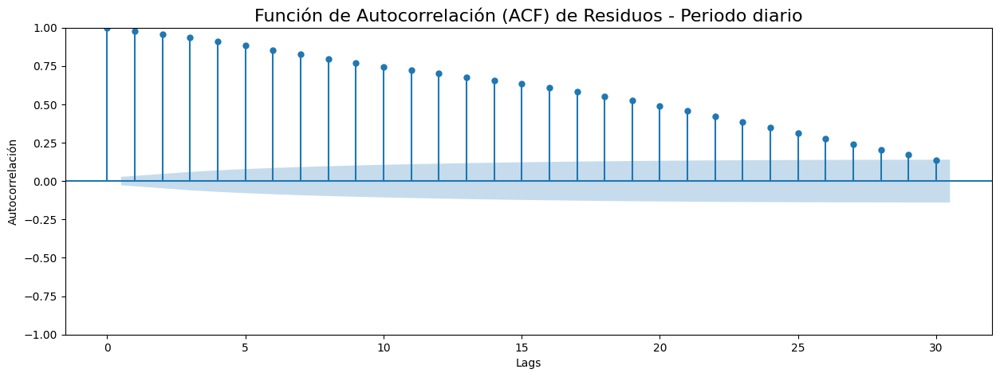

In [0]:
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

# Calcular la ACF
acf_values = acf(pdf_decomposed['resid_daily'], nlags=30)

# Generar el correlograma
fig, ax = plt.subplots(figsize=(15, 5))
plot_acf(pdf_decomposed['count'], lags=30, ax=ax)

ax.set_title('Función de Autocorrelación (ACF) de Residuos - Periodo diario', fontsize=16)
ax.set_xlabel('Lags', fontsize=10)
ax.set_ylabel('Autocorrelación', fontsize=10)

plt.show()

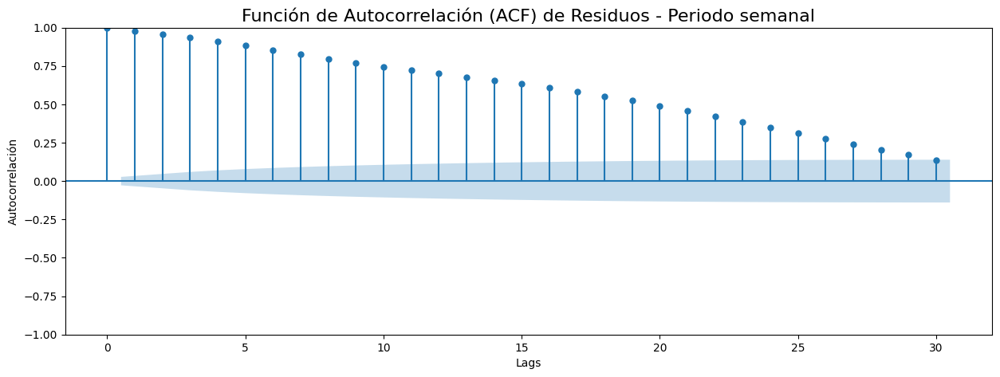

In [0]:
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

# Calcular la ACF
acf_values = acf(pdf_decomposed['resid_weekly'], nlags=30)

# Generar el correlograma
fig, ax = plt.subplots(figsize=(15, 5))
plot_acf(pdf_decomposed['count'], lags=30, ax=ax)

ax.set_title('Función de Autocorrelación (ACF) de Residuos - Periodo semanal', fontsize=16)
ax.set_xlabel('Lags', fontsize=10)
ax.set_ylabel('Autocorrelación', fontsize=10)

plt.show()

**prueba de Ljung-Box - Autocorrelación de residuos**
Interpretación
1.	lb_stat (Estadístico de Ljung-Box):
o	Este valor es el estadístico de la prueba de Ljung-Box. Un valor alto indica que hay una autocorrelación significativa en los residuos.
o	En tu caso, lb_stat = 23651.675275, que es un valor extremadamente alto.
2.	lb_pvalue (Valor p):
o	El valor p indica la probabilidad de obtener un valor del estadístico de prueba al menos tan extremo como el observado, bajo la hipótesis nula de que no hay autocorrelación en los residuos.
o	Un valor p muy bajo (generalmente < 0.05) indica que podemos rechazar la hipótesis nula y concluir que hay autocorrelación significativa en los residuos.
o	En tu caso, lb_pvalue = 0.0, que es mucho menor que 0.05.
Conclusión
Dado que tu valor lb_stat es extremadamente alto y tu lb_pvalue es 0.0, puedes concluir que hay una autocorrelación significativa en los residuos. Esto significa que los residuos de tu modelo no son ruido blanco (no son independientes entre sí) y el modelo no ha capturado toda la estructura temporal en los datos.


In [0]:
from statsmodels.stats.diagnostic import acorr_ljungbox

# Convertir el DataFrame de Spark a Pandas
#pandas_df_residuals = pdf_decomposed.select("resid_weekly").toPandas()

# Convertir la columna de residuos a una Serie de Pandas
residuals_series = pdf_decomposed["resid_weekly"]

# Verificar si hay valores nulos y eliminarlos
print("Número de valores nulos:", residuals_series.isnull().sum())
residuals_series = residuals_series.dropna()

# Asegurarse de que la serie tiene suficientes datos
print("Número de observaciones:", len(residuals_series))
if len(residuals_series) < 10:
    raise ValueError("La serie de residuos es demasiado pequeña para la prueba de Ljung-Box.")


# Realizar la prueba de Ljung-Box
ljung_box_result = acorr_ljungbox(residuals_series, lags=[10], return_df=True)
print(ljung_box_result)

# lb_stat es extremadamente alto y lb_pvalue es 0.0, puedes concluir que hay una autocorrelación significativa en los residuos


**Prueba de normalidad Shapiro-Wilk Test**

Interpretación
1.	Estadístico de Shapiro-Wilk (Statistic):
o	El estadístico de Shapiro-Wilk varía entre 0 y 1. Un valor más cercano a 1 sugiere que los datos se distribuyen normalmente.
o	En tu caso, el valor del estadístico es 0.9635114669799805, lo que sugiere que hay cierta desviación de la normalidad, aunque no es extremadamente baja.
2.	Valor p (p-value):
o	El valor p indica la probabilidad de obtener un valor del estadístico de prueba al menos tan extremo como el observado, bajo la hipótesis nula de que los datos son normales.
o	Un valor p muy bajo (generalmente < 0.05) indica que podemos rechazar la hipótesis nula y concluir que los datos no siguen una distribución normal.
o	En tu caso, el valor p es 5.229833141525898e-32, que es extremadamente bajo (mucho menor que 0.05).
Conclusión
Dado que el valor p es extremadamente bajo (5.229833141525898e-32), puedes concluir que los residuos no siguen una distribución normal. Esto sugiere que hay una estructura en los datos que no está siendo capturada adecuadamente por el modelo y que los residuos presentan una desviación significativa de la normalidad.


In [0]:
from scipy.stats import shapiro
import pandas as pd

# Convertir la columna de residuos a una Serie de Pandas
residuals_series = pdf_decomposed["resid_weekly"]

# Verificar si hay valores nulos y eliminarlos
print("Número de valores nulos:", residuals_series.isnull().sum())
residuals_series = residuals_series.dropna()

# Asegurarse de que la serie tiene suficientes datos
print("Número de observaciones:", len(residuals_series))
if len(residuals_series) < 10:
    raise ValueError("La serie de residuos es demasiado pequeña para la prueba de Ljung-Box.")

# Realizar la prueba de Shapiro-Wilk
shapiro_test_stat, shapiro_p_value = shapiro(residuals_series)
print(f'Shapiro-Wilk Test: Statistic={shapiro_test_stat}, p-value={shapiro_p_value}')

#valor p es extremadamente bajo (5.229833141525898e-32), puedes concluir que los residuos no siguen una distribución normal

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import boxcox
#from pmdarima import auto_arima
from statsmodels.graphics.gofplots import qqplot

# Convertir la columna de residuos a una Serie de Pandas
count_series = pdf_decomposed["count"]

# Verificar si hay valores nulos y eliminarlos
print("Número de valores nulos:", count_series.isnull().sum())
count_series = count_series.dropna()

# Asegurarse de que la serie tiene suficientes datos
print("Número de observaciones:", len(count_series))
if len(count_series) < 10:
    raise ValueError("La serie de residuos es demasiado pequeña.")

# Si el valor mínimo es menor o igual a 0, agregar una constante para hacer todos los valores positivos
min_value = count_series.min()
if min_value <= 0:
    constant = abs(min_value) + 1
    data_transformed = count_series + constant
else:
    data_transformed = count_series

# Aplicar la transformación de Box-Cox
data_boxcox, lambda_ = boxcox(data_transformed)
print(f'Transformación de Box-Cox aplicada con lambda = {lambda_}')

# Visualizar los datos transformados
plt.figure(figsize=(10, 6))
plt.plot(data_boxcox, label='Box-Cox Transformed Data')
plt.title('Box-Cox Transformed Data')
plt.legend()
plt.show()

In [0]:
from statsmodels.tsa.tsatools import lagmat
import pandas as pd

# Crear las series de tiempo desplazadas
max_lag = 5
lagged_values = lagmat(pdf['count'], max_lag, trim='both')

# Crear nombres de columnas para las series de tiempo desplazadas
columns = [f'lag_{i}' for i in range(1, max_lag + 1)]

# Crear un DataFrame con los valores actuales y los desplazados
lagged_df = pd.DataFrame(lagged_values, columns=columns)
lagged_df['count'] = pdf['count'][max_lag:].reset_index(drop=True)


In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

# Generar la matriz de dispersión
sns.pairplot(lagged_df)

# Ajustar y mostrar el gráfico
plt.suptitle('Scatterplot Matrix of Current Values and Lagged Values', y=1.02, fontsize=16)
plt.show()


In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col

def getDuplicateColumns(df):
    # Convertir DataFrame a RDD para manipulación
    rdd = df.rdd

    # Crear un diccionario que agrupe las columnas por sus tipos de datos
    groups = {}
    for field in df.schema.fields:
        if field.dataType not in groups:
            groups[field.dataType] = []
        groups[field.dataType].append(field.name)

    # Lista para almacenar las columnas duplicadas
    dups = []


In [0]:
# Initialize Spark session
spark = SparkSession.builder.appName("LoadCSVFiles").getOrCreate()

storage_account_name = 'stgaclnrmlab'
storage_account_access_key = 'rf/4ogYc/eG+oqVD8K9xjsVamosf1qO1s0Kab+ujHsTt0GjaGY2XHfXFNVdti4iaUndCJjNSqizi+ASt8IWqHw=='

# Configurate access to Blob Storage
spark.conf.set(f"fs.azure.account.key.{storage_account_name}.blob.core.windows.net", storage_account_access_key)

# Blob Storage directory
blob_container = 'data'
archivo_geojson = f"wasbs://data@stgaclnrmlab.blob.core.windows.net/source/geo_data/Belgium_streets.json"

import geopandas as gpd

df_belgium = gpd.read_file(archivo_geojson)

#df_bruxelles = gpd.read_file(archivo_geojson)
#print('Anderlecht total number of streets ' + str(df_bruxelles.shape[0]))
#
## Visualizar los datos con Folium
#polygons = df_bruxelles
#
#m = folium.Map([50.85045, 4.34878], zoom_start=13, tiles='cartodbpositron')
#folium.GeoJson(polygons).add_to(m)
#
## Guardar el mapa en un archivo HTML
#m.save('map.html')
#
## Mostrar el mapa en un entorno Jupyter Notebook (opcional)
#from IPython.display import display, HTML
#display(HTML('map.html'))

In [0]:
from azure.storage.blob import BlobServiceClient
import os

storage_account_name = 'stgaclnrmlab'
storage_account_access_key = 'rf/4ogYc/eG+oqVD8K9xjsVamosf1qO1s0Kab+ujHsTt0GjaGY2XHfXFNVdti4iaUndCJjNSqizi+ASt8IWqHw=='
blob_container = 'data'
blob_name = 'source/geo_data/Belgium_streets.json'

# Crear un cliente de BlobService
blob_service_client = BlobServiceClient(account_url=f"https://{storage_account_name}.blob.core.windows.net", credential=storage_account_access_key)
container_client = blob_service_client.get_container_client(blob_container)
blob_client = container_client.get_blob_client(blob_name)

# Descargar el archivo localmente
download_file_path = f"/tmp/{blob_name.split('/')[-1]}"
with open(download_file_path, "wb") as download_file:
    download_file.write(blob_client.download_blob().readall())



In [0]:
import geopandas as gpd

df_belgium = gpd.read_file(download_file_path)
print('Anderlecht total number of streets ' + str(df_belgium.shape[0]))


In [0]:
import folium

# Visualizar los datos con Folium
polygons = df_belgium
m = folium.Map([50.85045, 4.34878], zoom_start=13, tiles='cartodbpositron')
folium.GeoJson(polygons).add_to(m)

# Guardar el mapa en un archivo HTML
map_path = f"/tmp/map.html"
m.save(map_path)

# Mostrar el mapa en un entorno Jupyter Notebook (opcional)
from IPython.display import display, HTML
display(HTML('/tmp/map.html'))


In [0]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Asumiendo que ya tienes df_belgium como un GeoDataFrame
df_belgium.plot()
plt.show()


In [0]:
%pip install keplergl

In [0]:
from keplergl import KeplerGl
import geopandas as gpd

# Asumiendo que ya tienes df_belgium como un GeoDataFrame
map_1 = KeplerGl(height=400)
map_1.add_data(data=df_belgium, name="Belgium Streets")
map_1.save_to_html(file_name= f"/tmp/map.html")

# Para mostrar el mapa en el notebook
#from IPython.display import display, HTML
#display(HTML('/tmp/map.html'))


In [0]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("GeoJSON Processing") \
    .getOrCreate()

storage_account_name = 'stgaclnrmlab'
storage_account_access_key = 'rf/4ogYc/eG+oqVD8K9xjsVamosf1qO1s0Kab+ujHsTt0GjaGY2XHfXFNVdti4iaUndCJjNSqizi+ASt8IWqHw=='

spark.conf.set(f"fs.azure.account.key.{storage_account_name}.blob.core.windows.net", storage_account_access_key)

blob_container = 'data'
archivo_geojson = f"wasbs://{blob_container}@{storage_account_name}.blob.core.windows.net/source/geo_data/Belgium_streets.json"


In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col

# Crear la sesión de Spark
spark = SparkSession.builder.appName("GeoJSON Processing").getOrCreate()

# Configurar acceso a Azure Blob Storage
storage_account_name = 'stgaclnrmlab'
storage_account_access_key = 'rf/4ogYc/eG+oqVD8K9xjsVamosf1qO1s0Kab+ujHsTt0GjaGY2XHfXFNVdti4iaUndCJjNSqizi+ASt8IWqHw=='
spark.conf.set(f"fs.azure.account.key.{storage_account_name}.blob.core.windows.net", storage_account_access_key)

# Ruta del archivo en Azure Blob Storage
archivo_geojson = f"wasbs://{blob_container}@{storage_account_name}.blob.core.windows.net/source/geo_data/Belgium_streets.json"

# Leer el archivo JSON como un DataFrame
df_geojson = spark.read.option("multiline", "true").json(archivo_geojson)

# Mostrar el esquema del DataFrame
df_geojson.printSchema()

# Mostrar las primeras filas del DataFrame
df_geojson.show()


In [0]:
from pyspark.sql import SparkSession
import geopandas as gpd
import folium
from pyspark.sql import functions as F



# Leer el archivo GeoJSON con GeoPandas
df_bruxelles = gpd.read_file(archivo_geojson)
print('Anderlecht total number of streets ' + str(df_bruxelles.shape[0]))

# Si necesitas convertir el GeoDataFrame a un DataFrame de PySpark
df_bruxelles_spark = spark.createDataFrame(df_bruxelles)

# Convertir las geometrías a WKT (Well-Known Text) para almacenarlas en un DataFrame de PySpark
df_bruxelles_spark = df_bruxelles_spark.withColumn("geometry", F.col("geometry").cast("string"))

# Mostrar algunas filas del DataFrame de PySpark
df_bruxelles_spark.show(5)

# Visualizar los datos con Folium
polygons = df_bruxelles

m = folium.Map([50.85045, 4.34878], zoom_start=13, tiles='cartodbpositron')
folium.GeoJson(polygons).add_to(m)

# Guardar el mapa en un archivo HTML
m.save('map.html')

# Mostrar el mapa en un entorno Jupyter Notebook (opcional)
from IPython.display import display, HTML
display(HTML('map.html'))

# Detener la sesión de Spark
spark.stop()


In [0]:
# Initialize Spark session
spark = SparkSession.builder.appName("LoadCSVFiles").getOrCreate()

storage_account_name = 'stgaclnrmlab'
storage_account_access_key = 'rf/4ogYc/eG+oqVD8K9xjsVamosf1qO1s0Kab+ujHsTt0GjaGY2XHfXFNVdti4iaUndCJjNSqizi+ASt8IWqHw=='

# Configurate access to Blob Storage
spark.conf.set(f"fs.azure.account.key.{storage_account_name}.blob.core.windows.net", storage_account_access_key)

# Blob Storage directory
blob_container = 'data'
archivo_geojson = f"wasbs://{blob_container}@{storage_account_name}.blob.core.windows.net/source/geo_data/Belgium_streets.json"

df_bel_geo = spark.read.json(archivo_geojson)

In [0]:
df_bel_geo = df_bel_geo.drop('_corrupt_record', 'type')
df_bel_geo = df_bel_geo.filter(df_bel_geo['geometry'].isNotNull())


df_bel_geo = df_bel_geo.select(explode("geometry.coordinates").alias("geometry"))

df_bel_geo = df_bel_geo.select(posexplode("geometry").alias("element", "coordinates")
).select(
    col("element").alias("element"),
    col("coordinates").alias("coordinates")
)

#df_bel_geo = df_bel_geo.withColumn("latitude", col("coordinates").getItem(1)) \
#                 .withColumn("longitude", col("coordinates").getItem(0)) \
 #                .drop("coordinates")

In [0]:
df_pandas = df_bel_geo.toPandas()

df_pandas['geometry'] = gpd.points_from_xy(df_pandas['coordinates'].apply(lambda x: x[0]), df_pandas['coordinates'].apply(lambda x: x[1]))

# Convertir el DataFrame de pandas con geometrías a un GeoDataFrame
gdf = gpd.GeoDataFrame(df_pandas, geometry='geometry')

gdf = gpd.set_crs(epsg=4326)
print(gdf)

In [0]:
from fiona.crs import from_epsg
gdf = gdf.set_crs(epsg=4326)

In [0]:
import folium
import json

# Convert the NumPy array to a Python list
gdf_list = gdf.values.tolist()

# Create a map centered on Belgium
m = folium.Map([50.85045, 4.34878], zoom_start=7, tiles='cartodbpositron')

# Add the GeoDataFrame to the map
folium.GeoJson(json.loads(json.dumps(gdf_list))).add_to(m)

# Add layer controls
folium.LayerControl().add_to(m)

# Show the map
m.save('map.html')


In [0]:
display(df_bel_geo)

In [0]:
import pandas as pd

In [0]:

import geopandas as gpd
import shapely
from pyspark.sql import SparkSession
from shapely.geometry import Point

df_pandas = df_bel_geo.toPandas()

# Crear una GeoDataFrame de GeoPandas a partir del DataFrame de pandas usando las columnas de latitud y longitud
gdf = gpd.GeoDataFrame(df_pandas, geometry=gpd.points_from_xy(df_pandas.longitude, df_pandas.latitude))

In [0]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Suponiendo que tu GeoDataFrame se llama gdf

# Cargar un mapa base
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Plotear el mapa base
ax = world.plot(color='white', edgecolor='black')

# Plotear los puntos del GeoDataFrame
gdf.plot(ax=ax, marker='o', color='red', markersize=5)

# Mostrar el mapa
plt.show()
